## import the important packages

In [4]:
pip install plotly

In [5]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import re
import plotly.express as px
pd.set_option("display.max_rows",None)
pd.set_option("display.max_columns",None)

In [6]:
df =pd.read_csv("listings (2).csv")

In [7]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,17475,Rental unit in 08013 Barcelona · ★4.40 · 1 bed...,65623,Luca,Eixample,la Dreta de l'Eixample,41.399390,2.17044,Entire home/apt,140.0,5,26,2023-12-04,0.16,1,32,9,NaN
1,18674,Rental unit in Barcelona · ★4.33 · 3 bedrooms ...,71615,Mireia Maria,Eixample,la Sagrada Família,41.405560,2.17262,Entire home/apt,121.0,1,40,2023-11-07,0.31,30,39,7,HUTB-002062
2,198958,Rental unit in Barcelona · ★4.69 · 4 bedrooms ...,971768,Laura,Sant Martí,Diagonal Mar i el Front Marítim del Poblenou,41.408050,2.21487,Entire home/apt,304.0,2,105,2023-10-16,0.74,9,137,26,HUTB-000926
3,23197,Rental unit in Sant Adria de Besos · ★4.77 · 3...,90417,Etain (Marnie),Sant Martí,el Besòs i el Maresme,41.412432,2.21975,Entire home/apt,200.0,3,75,2023-11-25,0.48,2,300,11,HUTB005057
4,32711,Rental unit in Barcelona · ★4.48 · 2 bedrooms ...,135703,Nick,Gràcia,el Camp d'en Grassot i Gràcia Nova,41.405660,2.17015,Entire home/apt,79.0,1,99,2023-10-18,0.66,3,297,16,HUTB-001722


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18321 entries, 0 to 18320
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              18321 non-null  int64  
 1   name                            18321 non-null  object 
 2   host_id                         18321 non-null  int64  
 3   host_name                       18319 non-null  object 
 4   neighbourhood_group             18321 non-null  object 
 5   neighbourhood                   18321 non-null  object 
 6   latitude                        18321 non-null  float64
 7   longitude                       18321 non-null  float64
 8   room_type                       18321 non-null  object 
 9   price                           16056 non-null  float64
 10  minimum_nights                  18321 non-null  int64  
 11  number_of_reviews               18321 non-null  int64  
 12  last_review                     

**from the first look we see that we have missing data in price,last_review ,reviews_per_month  and license we will take diecssion about this column during the work**


In [9]:
df[["name"]]

,name
0,Rental unit in 08013 Barcelona · ★4.40 · 1 bed...
1,Rental unit in Barcelona · ★4.33 · 3 bedrooms ...
2,Rental unit in Barcelona · ★4.69 · 4 bedrooms ...
3,Rental unit in Sant Adria de Besos · ★4.77 · 3...
4,Rental unit in Barcelona · ★4.48 · 2 bedrooms ...
5,Rental unit in Barcelona · ★4.80 · 1 bedroom ·...
6,Condo in Barcelona · ★3.40 · 1 bedroom · 1 bed...
7,Rental unit in Barcelona · ★4.71 · 2 bedrooms ...
8,Rental unit in Barcelona · ★4.88 · 1 bedroom ·...
9,Rental unit in Barcelona · ★4.53 · 4 bedrooms ...


##from column name we can extract alot of data about the listing like  

*   number of beds
*   rating
*   type of the bath



  

In [10]:
def review(describ):
  """
  function to get the rating number from the name column text
  and return it
  """

  match = re.search(r"(?<=★)(\d+\.\d{1,2})",describ)
  if match:
    return float(match.group())
  else:
    return None

In [11]:
df["rating"] = df["name"].apply(review)

In [12]:
df["rating"].isna().sum()/len(df)

0.3802194203373178

***more than 45% from the ratings are missd thats need to be considered***

In [13]:
df["descrption"]=df["name"].apply(lambda x : x.split("·")[0].strip())

In [14]:
df["descrption"].value_counts()

Rental unit in Barcelona                           14927
Condo in Barcelona                                   612
Serviced apartment in Barcelona                      541
Hotel in Barcelona                                   421
Loft in Barcelona                                    324
Hostel in Barcelona                                  305
Home in Barcelona                                    287
Boutique hotel in Barcelona                          191
casa particular in Barcelona                          95
Bed and breakfast in Barcelona                        92
Rental unit in BARCELONA                              84
Guest suite in Barcelona                              58
Guesthouse in Barcelona                               47
Vacation home in Barcelona                            36
Place to stay in Barcelona                            32
Villa in Barcelona                                    32
Townhouse in Barcelona                                31
Rental unit in L'Hospitalet de 

In [15]:
df["bedrooms"] =df["name"].apply(lambda x:int(re.search("\d\ bedroom",x).group().split(" ")[0]) if re.search("\d\ bedroom",x) else 0 )

In [16]:
df["bedrooms"]

0        1
1        3
2        4
3        3
4        2
5        1
6        1
7        2
8        1
9        4
10       1
11       2
12       1
13       1
14       2
15       2
16       2
17       2
18       1
19       2
20       3
21       4
22       1
23       3
24       4
25       1
26       2
27       2
28       1
29       4
30       2
31       3
32       3
33       3
34       3
35       1
36       3
37       1
38       1
39       1
40       1
41       1
42       1
43       1
44       3
45       3
46       3
47       1
48       4
49       2
50       1
51       3
52       3
53       1
54       3
55       1
56       1
57       3
58       3
59       2
60       2
61       2
62       3
63       1
64       1
65       2
66       3
67       1
68       4
69       2
70       2
71       3
72       3
73       3
74       4
75       1
76       2
77       2
78       2
79       1
80       1
81       3
82       2
83       1
84       1
85       2
86       2
87       2
88       1
89       1
90       1

In [17]:
df["beds"] =df["name"].apply(lambda x:int(re.search("\d\ bed",x).group().split(" ")[0]) if re.search("\d\ bed",x) else 0 )

In [18]:
df["beds"]

0        1
1        3
2        4
3        3
4        2
5        1
6        1
7        2
8        1
9        4
10       1
11       2
12       1
13       1
14       2
15       2
16       2
17       2
18       1
19       2
20       3
21       4
22       1
23       3
24       4
25       1
26       2
27       2
28       1
29       4
30       2
31       3
32       3
33       3
34       3
35       1
36       3
37       1
38       1
39       1
40       1
41       1
42       1
43       1
44       3
45       3
46       3
47       1
48       4
49       2
50       1
51       3
52       3
53       1
54       3
55       1
56       1
57       3
58       3
59       2
60       2
61       2
62       3
63       1
64       1
65       2
66       3
67       1
68       4
69       2
70       2
71       3
72       3
73       3
74       4
75       1
76       2
77       2
78       2
79       1
80       1
81       3
82       2
83       1
84       1
85       2
86       2
87       2
88       1
89       1
90       1

In [19]:
df["bath"] =df["name"].apply(lambda x:re.search(r"\d\ [a-z]* bath|\d\ bath|\ [a-z A-Z]*-bath",x).group().strip() if re.search(r"\d\ [a-z A-Z]* bath|\d\ bath|\ [a-z A-Z]*-bath",x) else 0 )

In [20]:
len(df["bath"].unique())

21

**discover different typs of baths we have 21 type**

In [21]:
df.nunique()

id                                18321
name                               6256
host_id                            7016
host_name                          3366
neighbourhood_group                  10
neighbourhood                        71
latitude                           9338
longitude                         10149
room_type                             4
price                               567
minimum_nights                       86
number_of_reviews                   553
last_review                        1651
reviews_per_month                   791
calculated_host_listings_count       66
availability_365                    366
number_of_reviews_ltm               180
license                            5692
rating                              174
descrption                           72
bedrooms                             10
beds                                 10
bath                                 21
dtype: int64

## now we will study null values in price column to try to impute it

In [22]:
df.isnull().sum()

id                                   0
name                                 0
host_id                              0
host_name                            2
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                             2265
minimum_nights                       0
number_of_reviews                    0
last_review                       4369
reviews_per_month                 4369
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
license                           5917
rating                            6966
descrption                           0
bedrooms                             0
beds                                 0
bath                                 0
dtype: int64

In [23]:
df[df["price"].isnull()]

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,descrption,bedrooms,beds,bath
15,223096,Loft in Barcelona · ★4.81 · 2 bedrooms · 2 bed...,874133,Barbara,Sants-Montjuïc,Sants,41.373640,2.139060,Entire home/apt,NaN,31,61,2023-10-02,0.42,1,0,12,Exempt,4.81,Loft in Barcelona,2,2,2 bath
67,190348,Rental unit in Barcelona · 1 bedroom · 1 bed ·...,919480,Elisa,Les Corts,Pedralbes,41.388930,2.124430,Private room,NaN,7,1,2016-06-09,0.01,1,0,0,NaN,NaN,Rental unit in Barcelona,1,1,1 bath
94,456333,Rental unit in Barcelona · ★4.90 · 1 bedroom ·...,2268672,Bruna,Eixample,el Fort Pienc,41.399370,2.175990,Private room,NaN,1,41,2017-11-01,0.29,1,0,0,NaN,4.90,Rental unit in Barcelona,1,1,5 bath
101,323854,Rental unit in Barcelona · ★4.56 · 1 bedroom ·...,1657312,Alberto,Eixample,la Sagrada Família,41.408430,2.174940,Private room,NaN,1,21,2014-07-29,0.15,1,0,0,NaN,4.56,Rental unit in Barcelona,1,1,1 bath
107,480975,Loft in Barcelona · 1 bedroom · 2 beds · 1 bath,2272146,Javi,Sants-Montjuïc,el Poble Sec,41.372270,2.165740,Private room,NaN,1,0,NaN,NaN,1,0,0,NaN,NaN,Loft in Barcelona,1,1,1 bath
140,343972,Rental unit in Barcelona · ★4.67 · 1 bedroom ·...,1744964,Patricia,Sants-Montjuïc,la Font de la Guatlla,41.371840,2.147990,Private room,NaN,2,7,2015-07-06,0.05,1,0,0,NaN,4.67,Rental unit in Barcelona,1,1,1 bath
151,526016,Rental unit in Barcelona · ★4.63 · 1 bedroom ·...,2585816,Oscar,Eixample,Sant Antoni,41.378060,2.160120,Private room,NaN,300,150,2020-03-15,1.91,2,0,0,NaN,4.63,Rental unit in Barcelona,1,1,1 shared bath
161,536440,Condo in Barcelona · ★4.79 · 1 bedroom · 1 bed...,2635405,Montserrat,Horta-Guinardó,el Baix Guinardó,41.409870,2.172030,Private room,NaN,31,43,2023-06-01,0.34,1,0,2,HUTB-010944,4.79,Condo in Barcelona,1,1,1 private bath
178,559801,Rental unit in Barcelona · ★4.69 · 1 bedroom ·...,2751629,Andrea,Sant Andreu,Navas,41.417700,2.186940,Private room,NaN,180,32,2020-01-01,0.25,1,0,0,NaN,4.69,Rental unit in Barcelona,1,1,5 shared bath
199,578180,Rental unit in Barcelona · ★4.78 · 1 bedroom ·...,2843953,July,Sant Martí,el Clot,41.405620,2.186580,Private room,NaN,7,10,2014-08-08,0.07,1,0,0,NaN,4.78,Rental unit in Barcelona,1,1,2 bath


In [24]:
df.isna().sum()

id                                   0
name                                 0
host_id                              0
host_name                            2
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                             2265
minimum_nights                       0
number_of_reviews                    0
last_review                       4369
reviews_per_month                 4369
calculated_host_listings_count       0
availability_365                     0
number_of_reviews_ltm                0
license                           5917
rating                            6966
descrption                           0
bedrooms                             0
beds                                 0
bath                                 0
dtype: int64

In [25]:
df.nunique()

id                                18321
name                               6256
host_id                            7016
host_name                          3366
neighbourhood_group                  10
neighbourhood                        71
latitude                           9338
longitude                         10149
room_type                             4
price                               567
minimum_nights                       86
number_of_reviews                   553
last_review                        1651
reviews_per_month                   791
calculated_host_listings_count       66
availability_365                    366
number_of_reviews_ltm               180
license                            5692
rating                              174
descrption                           72
bedrooms                             10
beds                                 10
bath                                 21
dtype: int64

<Axes: >

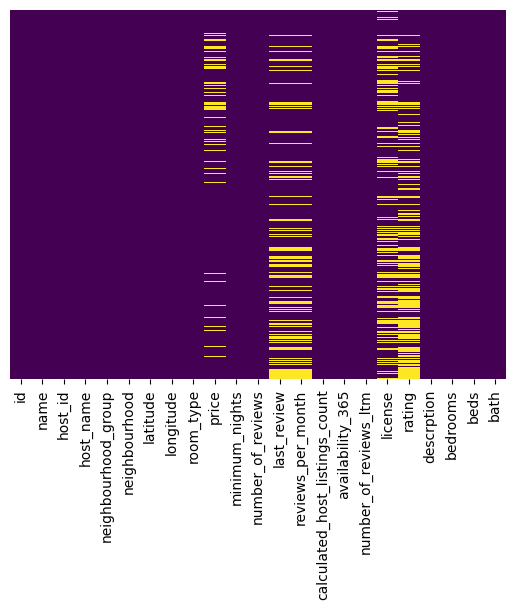

In [26]:
sns.heatmap(data=df.isnull(),yticklabels=False,cbar=False,cmap="viridis")

<Axes: xlabel='neighbourhood_group', ylabel='count'>

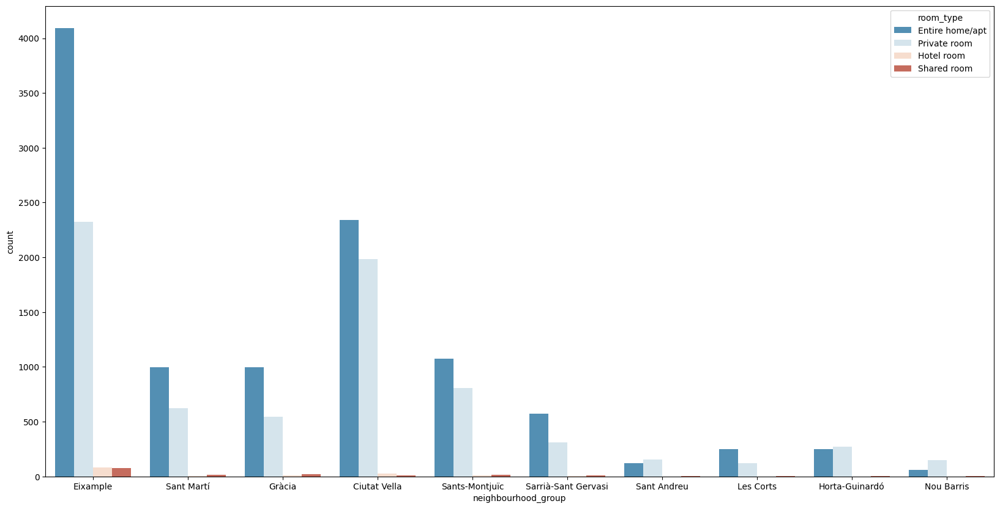

In [27]:
plt.figure(figsize=(20,10))
sns.countplot(x="neighbourhood_group",data=df,palette="RdBu_r",hue="room_type")

<Axes: xlabel='price'>

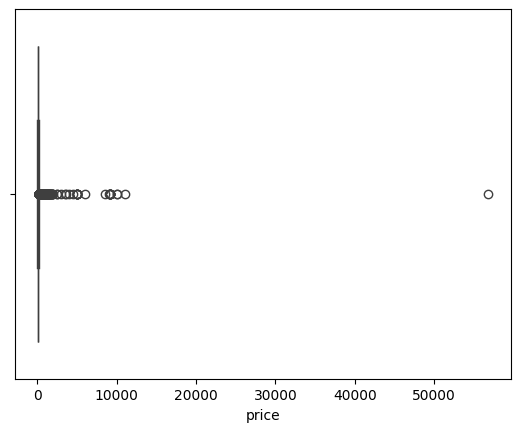

In [28]:
sns.boxplot(x="price",data=df)

### ***from this boxplot we discovered that we have outlier in price column that spoil the data distrbution now we will get fisrt and third qurtail to remove the outliers ***

In [29]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,rating,bedrooms,beds
count,1.832100e+04,1.832100e+04,18321.000000,18321.000000,16056.000000,18321.000000,18321.000000,13952.000000,18321.000000,18321.000000,18321.000000,11355.000000,18321.000000,18321.000000
mean,3.370245e+17,1.723186e+08,41.391914,2.166945,126.494083,14.865892,43.864309,1.443145,33.812838,171.187381,11.819933,4.594294,1.717319,1.758692
std,4.184948e+17,1.766263e+08,0.014042,0.017454,548.481873,31.514680,89.887244,1.894793,66.230543,136.551292,23.855482,0.350702,1.134199,1.103492
min,1.747500e+04,3.073000e+03,41.352720,2.085593,9.000000,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,2.239606e+07,1.023157e+07,41.381010,2.156690,50.000000,1.000000,1.000000,0.240000,1.000000,13.000000,0.000000,4.430000,1.000000,1.000000
50%,4.638623e+07,1.038178e+08,41.389521,2.168030,87.000000,3.000000,7.000000,0.830000,5.000000,176.000000,2.000000,4.670000,1.000000,1.000000
75%,8.064681e+17,3.289379e+08,41.401320,2.177490,130.000000,31.000000,44.000000,2.122500,29.000000,310.000000,15.000000,4.830000,2.000000,2.000000
max,1.045480e+18,5.496387e+08,41.459560,2.227710,56815.000000,1124.000000,1941.000000,67.300000,318.000000,365.000000,1065.000000,5.000000,9.000000,9.000000


In [30]:
qunatail1 , qunatail3 = np.nanpercentile(df["price"],[25,75])

In [31]:
iqr = qunatail3-qunatail1

In [32]:
lower_pound = qunatail1 - (1.5*iqr)
upper_pound = qunatail3 + (1.5*iqr)

In [33]:
lower_pound

-70.0

In [34]:
upper_pound

250.0

In [35]:
no_outliers = df.loc[(df["price"]<=upper_pound)&(df["price"]>=lower_pound)]

**converted last_review to datetime**

In [36]:
no_outliers["last_review"]=pd.to_datetime(no_outliers["last_review"])

<ipython-input-36-0e909a309afb>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  no_outliers["last_review"]=pd.to_datetime(no_outliers["last_review"])


<Axes: xlabel='room_type', ylabel='price'>

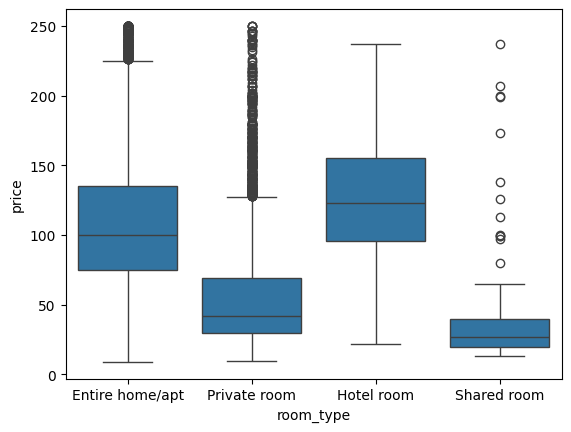

In [37]:
sns.boxplot(data=no_outliers,x="room_type",y="price")

we discoverd a relation between price and room type can sort the rooms from cheapest price range to more expensive one :


1.   shared room
2.   private room
3.   Entire home/apt
4.   Hotle room



<Axes: xlabel='neighbourhood_group', ylabel='price'>

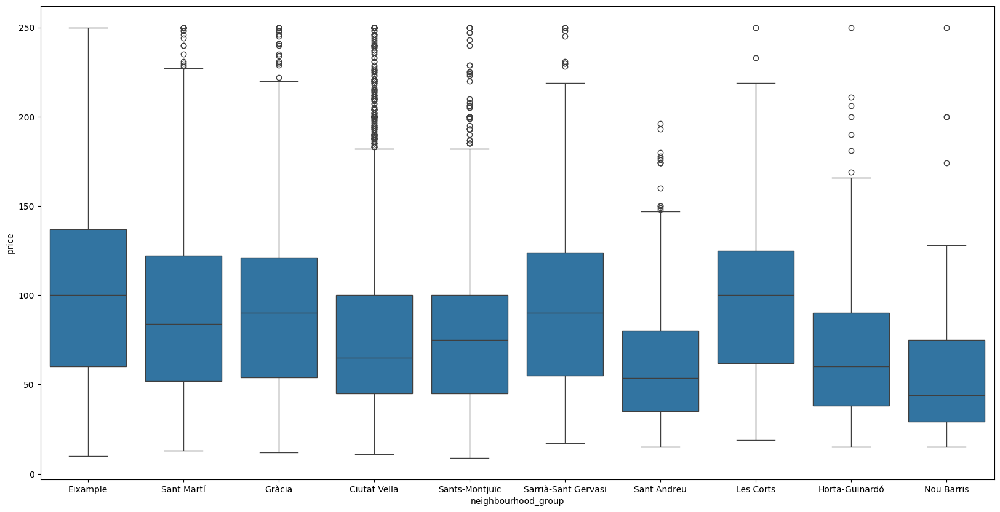

In [38]:
plt.figure(figsize=(20,10))
sns.boxplot(data=no_outliers,x="neighbourhood_group",y="price")

**from this graph we can see that we have at most same price range in all neighbourhoods groups excpt Sant Andreu and Nou Barris**

<Axes: xlabel='bath', ylabel='price'>

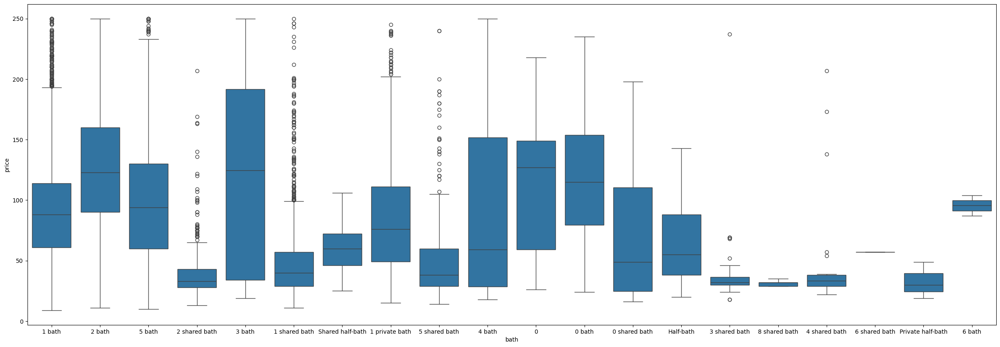

In [39]:
plt.figure(figsize=(30,10))
sns.boxplot(data=no_outliers,x="bath",y="price")

**we see here differnet relation betweeen price and the type of the bath room as we have range of prices for normal bath which is higher than range for shared and half bath**

<Axes: xlabel='beds', ylabel='price'>

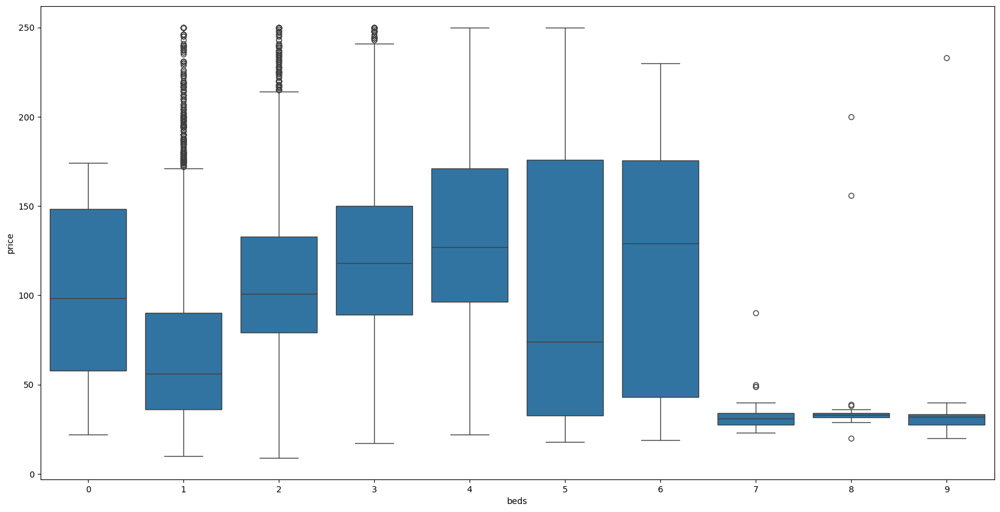

In [40]:
plt.figure(figsize=(20,10))
sns.boxplot(data=no_outliers,x="beds",y="price")

**b there we have another relation between number of beds in the apratement and the price we see taht as number of beds increase the price range increase untail we reach 6 beds after that the price range decrease:**

In [41]:
pivot_table =pd.pivot_table(index=["room_type","neighbourhood_group","beds","bath"],values="price", data=no_outliers,aggfunc=np.median)

### from all that we can use all this features to predict the price of the listings with null price

In [42]:
pivot_table

price
room_type       neighbourhood_group beds bath                    
Entire home/apt Ciutat Vella        0    1 bath              58.5
                                         5 bath             150.0
                                    1    0 bath              81.0
                                         1 bath              65.0
                                         2 bath              79.0
                                         5 bath              65.0
                                    2    0 bath              54.0
                                         1 bath              83.0
                                         2 bath             109.0
                                         3 bath              82.0
                                         5 bath              93.0
                                    3    0 bath              93.5
                                         1 bath              94.0
                                         2 bath             132.5
                                         3 bath             153.5
                                         5 bath             147.0
                                    4    0 bath              94.0
                                         1 bath              72.0
                                         2 bath             160.0
                                         3 bath             194.0
                                         4 bath             186.0
                                         5 bath             202.5
                                    5    2 bath             197.0
                                         3 bath             250.0
                                         5 bath             116.0
                                    6    2 bath             136.0
                                    7    4 bath              90.0
                                    8    5 bath             156.0
                Eixample            0    1 bath             167.0
                                    1    0 bath             107.0
                                         1 bath             100.0
                                         2 bath             120.0
                                         5 bath             118.0
                                         Half-bath          108.0
                                    2    0 bath             154.0
                                         1 bath             102.0
                                         2 bath             132.0
                                         3 bath             207.0
                                         5 bath             109.0
                                    3    0 bath             170.0
                                         1 bath             106.0
                                         2 bath             135.0
                                         3 bath             190.0
                                         4 bath             137.0
                                         5 bath             111.0
                                    4    0 bath             129.0
                                         1 bath             105.5
                                         2 bath             139.0
                                         3 bath             202.0
                                         4 bath             180.0
                                         5 bath             124.0
                                    5    2 bath             199.0
                                         3 bath             194.5
                                         4 bath             174.5
                                         5 bath             169.0
                                    6    2 bath             175.0
                                         3 bath             224.5
                                         4 bath             142.0
                                         5 bath             181.0
                Gràcia            

In [43]:
pivot_table_mean =pd.pivot_table(index=["room_type","neighbourhood_group"],values="price", data=df,aggfunc=np.median)

In [44]:
pivot_table_mean.loc[('Private room', 'Nou Barris')][0]

36.5

In [45]:
outliers = df.loc[(df["price"]>upper_pound)|(df["price"]<lower_pound)]

In [46]:
len(outliers)

974

In [47]:
len(no_outliers)

15082

In [48]:
def imput_price(col):
  price = col[0]
  room_type = col[1]
  nig = col[2]
  beds = col[3]
  bath = col[4]
  global new
  new = []
  if pd.isnull(price):
    try:
      return pivot_table.loc[(room_type,nig,beds,bath)][0]
    except:
      return pivot_table_mean.loc[(room_type,nig)][0]

  else:
    return price

In [49]:
df["neighbourhood_group"].unique()

array(['Eixample', 'Sant Martí', 'Gràcia', 'Ciutat Vella',
       'Sants-Montjuïc', 'Sarrià-Sant Gervasi', 'Sant Andreu',
       'Les Corts', 'Horta-Guinardó', 'Nou Barris'], dtype=object)

In [50]:
df["price"] =df[["price","room_type","neighbourhood_group","beds","bath"]].apply(imput_price,axis=1)

In [51]:
#  remove the outliers from the dataset
no_outliers = df.loc[(df["price"]<=upper_pound)&(df["price"]>=lower_pound)]

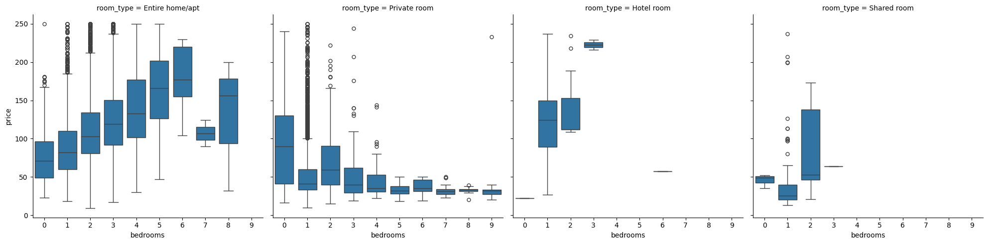

In [52]:
sns.catplot(x="bedrooms",y="price", col ="room_type",data=no_outliers,kind="box")

**as number of bed rooms increases in roomtype entier home the price increase untail we reach 7 bedrooms  on the other hand private room as number bedrooms increase price decrase**

## discover other null columns

<Axes: xlabel='price', ylabel='Count'>

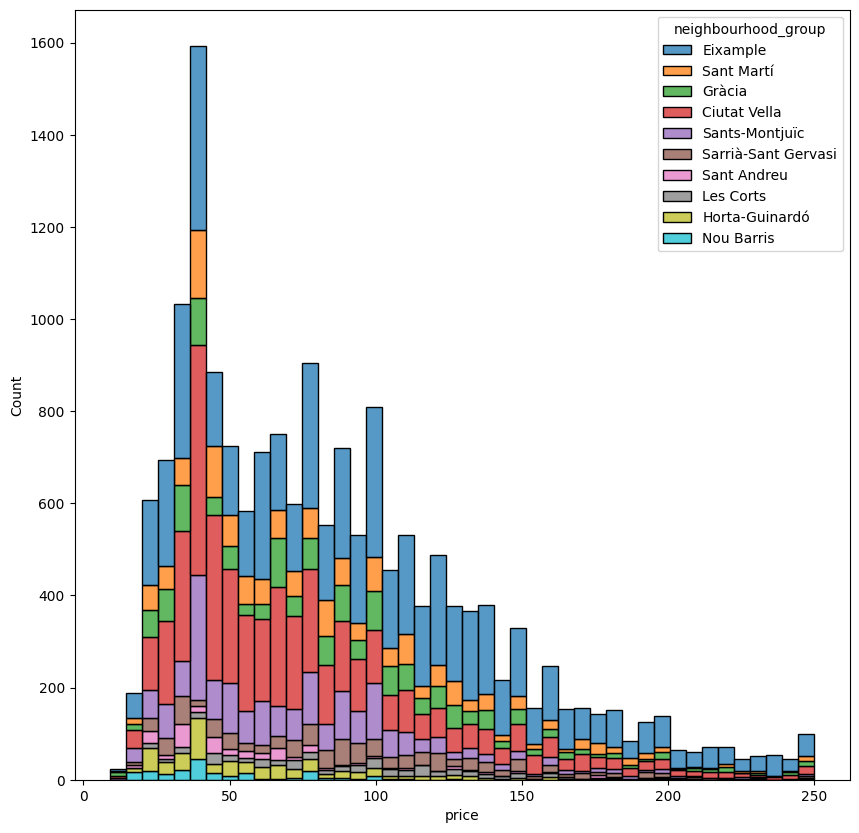

In [53]:
plt.figure(figsize=(10,10))
sns.histplot(data=no_outliers,x="price",hue="neighbourhood_group",multiple="stack")

**This indicates that there is a greater demand for apartments in the Eixample neighbourhood, with prices ranging from less than 50 to 250. Additionally, there is a particular desire for apartments in Eixample that are priced between less than 50 and more than 40.**

In [54]:
len(df["price"])-len(no_outliers["price"])

974

**We had a discussion regarding the licenses column here; some listings have licenses, while others do not. Since the column is filled with exempted or the licence code, we will presume that a listing does not have a licence if it is null.**

<Axes: >

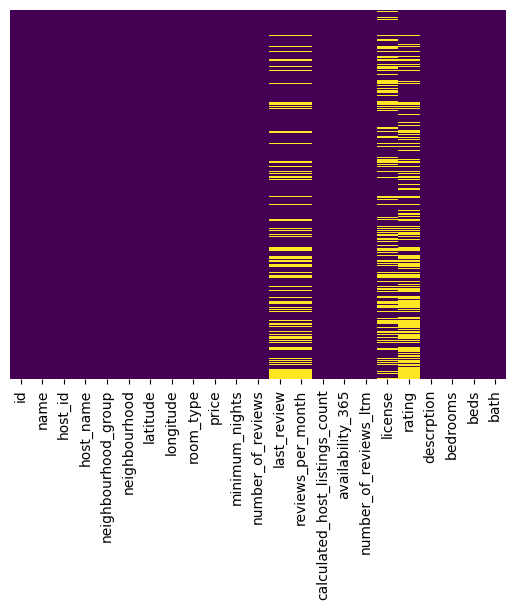

In [55]:
sns.heatmap(data=df.isnull(),yticklabels=False,cbar=False,cmap="viridis")

In [56]:
no_outliers["license"].fillna(0,inplace=True)

<ipython-input-56-75211fa718f3>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  no_outliers["license"].fillna(0,inplace=True)


In [57]:
no_outliers["license_enode"] = no_outliers["license"].apply(lambda x:0 if x == 0 else 1)

<ipython-input-57-74ed9063c9f5>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  no_outliers["license_enode"] = no_outliers["license"].apply(lambda x:0 if x == 0 else 1)


**we make a categorical encoding for the license column**

<Axes: xlabel='room_type', ylabel='count'>

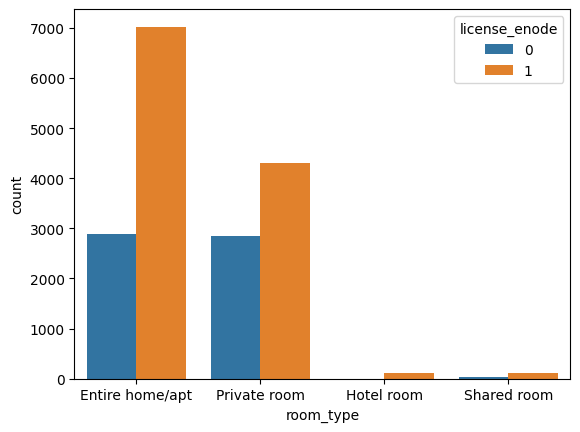

In [58]:
sns.countplot(data=no_outliers,x="room_type",hue="license_enode")

**Depending on the type of room, it appears that the majority of listings have licences, particularly in hotel rooms, where there appear to be roughly no unlicensed hotles.**

<Axes: xlabel='price', ylabel='Count'>

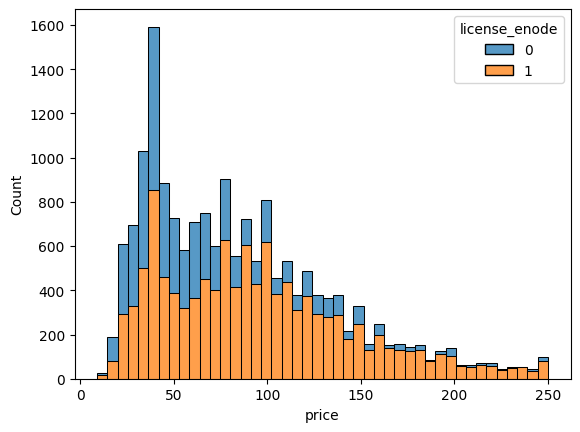

In [59]:
sns.histplot(data=no_outliers,x="price",hue="license_enode",multiple="stack")

In [60]:
no_outliers.drop("license", axis=1 , inplace=True)

<ipython-input-60-c822cf5acc20>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  no_outliers.drop("license", axis=1 , inplace=True)


**The rate of unlicended listings declines as the price rises.**

In [61]:
#(df[df["host_name"]=="Andres"])

In [62]:
#df[df.duplicated(["room_type","neighbourhood","neighbourhood_group","host_name"])]

<Axes: xlabel='neighbourhood_group', ylabel='count'>

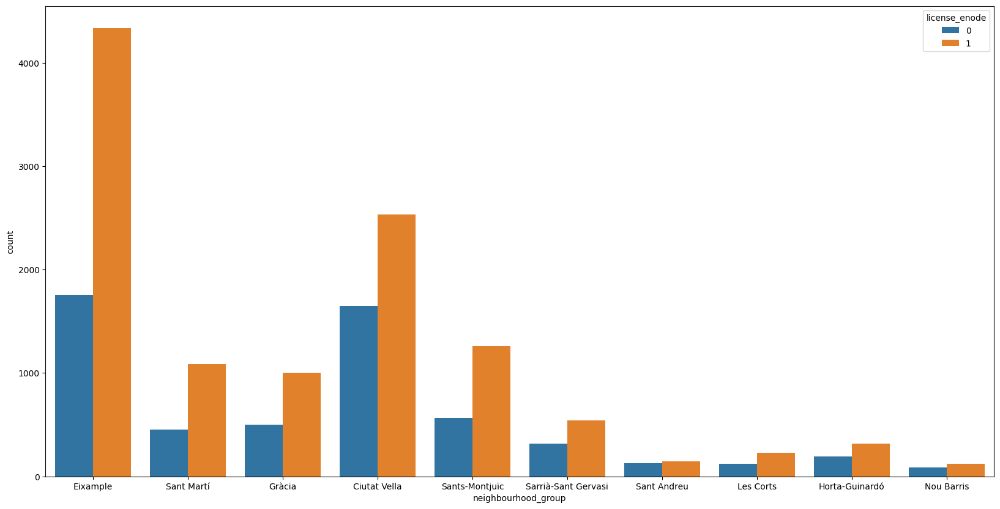

In [63]:
plt.figure(figsize=(20,10))
sns.countplot(data=no_outliers,x="neighbourhood_group",hue="license_enode")

**As we can see, licenced listings have the majority based on the neighbourhood group.**

In [64]:
#np.linspace(0,10,10)

In [65]:
def imput_rating(col):
  rating = col[0]
  room_type = col[1]
  nig = col[2]
  price = col[3]
  if pd.isnull(rating):
    try:
      return pivot_rating.loc[(room_type,nig,price)][0]
    except:
      return pivot_rating2.loc[(room_type)][0]

  else:
    return rating

In [66]:
pivot_rating = pd.pivot_table(index=["room_type","neighbourhood","price"],values="rating", data=no_outliers,aggfunc=np.mean)


In [67]:
pivot_rating2 = pd.pivot_table(index=["room_type"],values="rating", data=no_outliers,aggfunc=np.mean)


In [68]:
pivot_rating2

,rating
room_type,
Entire home/apt,4.574755
Hotel room,4.645056
Private room,4.619271
Shared room,4.508039


In [153]:
mask = ((no_outliers["number_of_reviews"]==0) & pd.isnull(no_outliers["rating"]))
len(no_outliers[mask])

0

In [152]:
no_outliers["rating"].isna().sum()

0

In [151]:
no_outliers["rating"] =no_outliers[["rating","room_type","neighbourhood","price"]].apply(imput_rating,axis=1)

<ipython-input-151-0850e618c3ac>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  no_outliers["rating"] =no_outliers[["rating","room_type","neighbourhood","price"]].apply(imput_rating,axis=1)


<ipython-input-154-db40acb9848f>:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(no_outliers["rating"])


<Axes: xlabel='rating', ylabel='Density'>

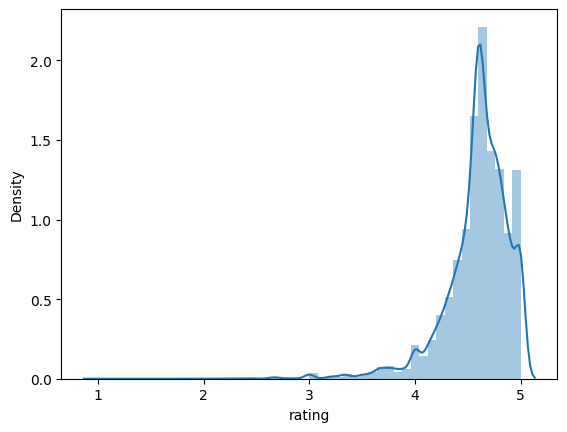

In [154]:
sns.distplot(no_outliers["rating"])

**we can see from this graph that is most off the listings take rating more than 4**

In [155]:
no_outliers["neighbourhood_group"].value_counts()

Eixample               6092
Ciutat Vella           4185
Sants-Montjuïc         1829
Sant Martí             1538
Gràcia                 1500
Sarrià-Sant Gervasi     859
Horta-Guinardó          510
Les Corts               351
Sant Andreu             278
Nou Barris              205
Name: neighbourhood_group, dtype: int64

<Axes: xlabel='count', ylabel='neighbourhood_group'>

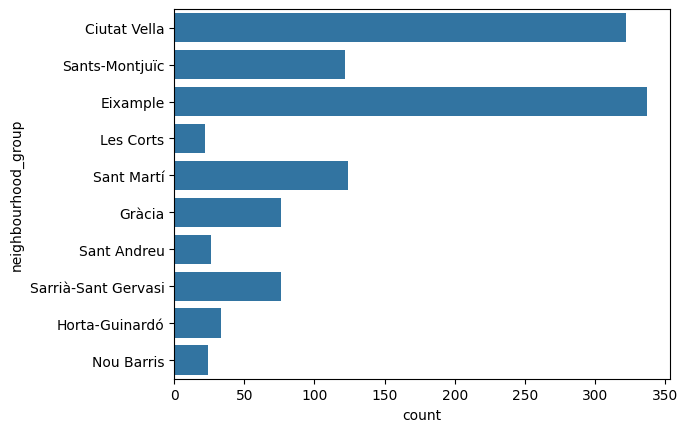

In [156]:
mask = ((no_outliers["rating"]==5.00))
sns.countplot(y="neighbourhood_group",data=no_outliers[mask])

**from this graph the highest nieghbourhood has rating is Eixample and Ciutat Vella and we well discover more about which neighbourhood in the group**

<Axes: xlabel='count', ylabel='neighbourhood'>

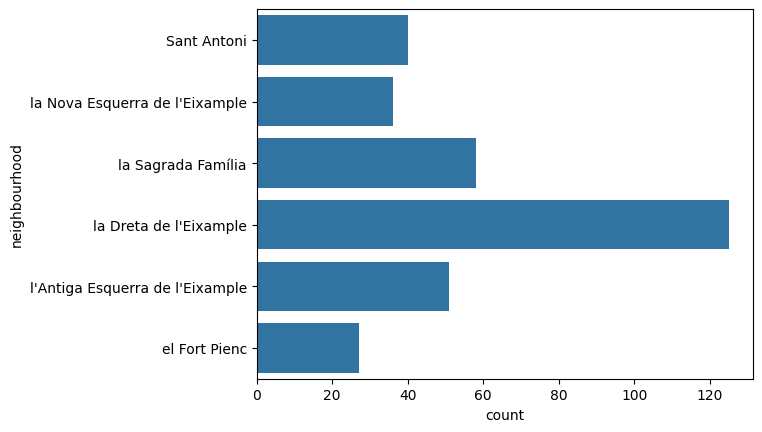

In [157]:
mask = ((no_outliers["neighbourhood_group"]=="Eixample")& (no_outliers["rating"]==5.00))
sns.countplot(y="neighbourhood",data=no_outliers[mask])


**la Dreta de L'Eixample is the nieghbourhood in Eixample which has the higest number of the 5 star ratings**

In [158]:
#sns.boxplot(data=no_outliers,x="rating")

In [159]:
#sns.catplot(x="room_type",y="price",data=no_outliers)

In [160]:
#sns.jointplot(x="room_type",y="price",data=no_outliers)

In [161]:
#no_outliers.columns

In [202]:
pd.crosstab(no_outliers["neighbourhood_group"],no_outliers["room_type"],no_outliers["price"],margins=True,aggfunc=np.mean)

room_type,Entire home/apt,Hotel room,Private room,Shared room,All
neighbourhood_group,,,,,
Ciutat Vella,92.525339,150.300000,54.663328,87.250000,75.176703
Eixample,124.597665,130.938272,58.512397,37.722222,98.715939
Gràcia,110.329764,108.636364,50.936449,27.050000,88.023333
Horta-Guinardó,86.924686,NaN,41.979478,35.000000,63.000980
Les Corts,109.338298,NaN,57.869369,50.000000,92.216524
Nou Barris,82.600000,NaN,39.068493,44.500000,50.853659
Sant Andreu,84.801653,NaN,40.849673,42.000000,59.996403
Sant Martí,109.160989,139.333333,53.673235,22.625000,86.348179
Sants-Montjuïc,96.162083,71.800000,46.712739,64.250000,74.526244


In [163]:
#plt.scatter(x=no_outliers["bedrooms"],y=no_outliers["price"])

In [164]:
#no_outliers[no_outliers['beds']>6][["price","bedrooms","beds","bath","room_type","neighbourhood","neighbourhood_group"]]

In [165]:
#sns.pairplot(data=no_outliers,hue="neighbourhood")

In [166]:
#no_outliers[no_outliers[["license"]]=="Exempt"]

In [167]:
#ns.histplot(data=no_outliers,x="rating",hue= no_outliers[no_outliers[["license"]]=="Exempt"])

In [168]:
#px.pie(no_outliers,values=[10,20,30],labels="neighbourhood_group")

In [169]:
#sns.catplot(x="license_enode",y="price", col ="room_type",data=no_outliers,kind="box")

In [170]:
#no_outliers.groupby(["neighbourhood_group"])["price"].agg([np.mean]).sort_values(by="mean")

<ipython-input-171-442fde636ca1>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(no_outliers.corr(),annot=True)


<Axes: >

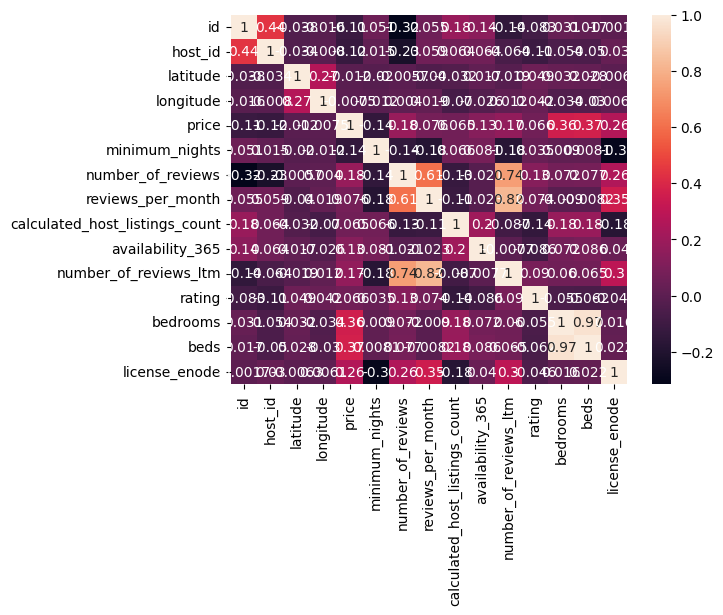

In [171]:
sns.heatmap(no_outliers.corr(),annot=True)

**number_of_reviews reviews_per_month is corleated with 0.57 percent and we discoverd from reading the data that if number of reviews is 0 last_review and review_per_month is NaN so we will fill last review with mode and review per month with zero**

In [172]:
no_outliers["last_review"].mode()[0]

'2023-11-26'

In [173]:
no_outliers["last_review"]=no_outliers["last_review"].fillna(no_outliers["last_review"].mode()[0])

<ipython-input-173-126381a4ce71>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  no_outliers["last_review"]=no_outliers["last_review"].fillna(no_outliers["last_review"].mode()[0])


In [174]:
no_outliers["reviews_per_month"].fillna(0,inplace=True)

<ipython-input-174-87d6519da50a>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  no_outliers["reviews_per_month"].fillna(0,inplace=True)


In [175]:
no_outliers["rating"].isna().sum()

0

<Axes: >

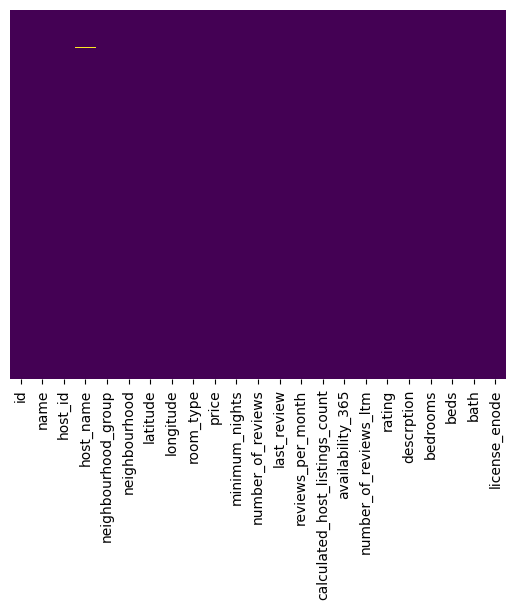

In [176]:
sns.heatmap(data=no_outliers.isnull(),yticklabels=False,cbar=False,cmap="viridis")

In [177]:
#sns.catplot(x="bedrooms",y="price", col ="room_type",data=no_outliers,kind="box")

In [178]:
#sns.catplot(x="bath",y="price", col ="room_type",data=no_outliers,kind="box",height=10,aspect=0.8)

In [179]:
#sns.catplot(x="beds",y="availability_365", col ="room_type",data=no_outliers,kind="box")

In [180]:
#sns.catplot(x="neighbourhood_group",y="rating", col ="room_type",data=no_outliers,kind="box")

In [181]:
no_outliers.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17347 entries, 0 to 18320
Data columns (total 23 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              17347 non-null  int64  
 1   name                            17347 non-null  object 
 2   host_id                         17347 non-null  int64  
 3   host_name                       17345 non-null  object 
 4   neighbourhood_group             17347 non-null  object 
 5   neighbourhood                   17347 non-null  object 
 6   latitude                        17347 non-null  float64
 7   longitude                       17347 non-null  float64
 8   room_type                       17347 non-null  object 
 9   price                           17347 non-null  float64
 10  minimum_nights                  17347 non-null  int64  
 11  number_of_reviews               17347 non-null  int64  
 12  last_review                     

In [193]:
no_last_review = no_outliers[no_outliers["last_review"]==no_outliers["last_review"].mode()[0]]

<Axes: xlabel='license_enode', ylabel='count'>

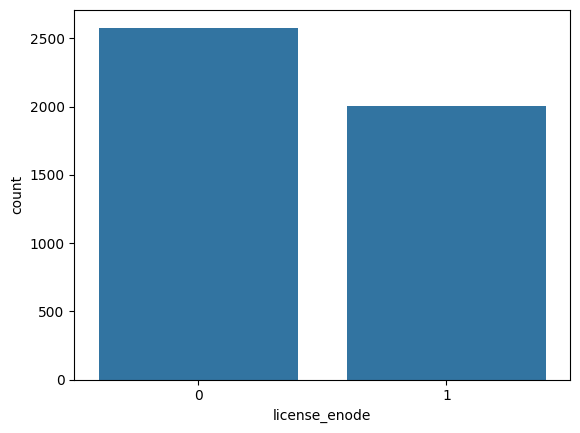

In [194]:
sns.countplot(data=no_last_review,x="license_enode")

**since we filled in the mode for the last review, we can see that the majority of listings on Unlincend did not have a last review or a number of reviews.**

<Axes: xlabel='neighbourhood_group', ylabel='count'>

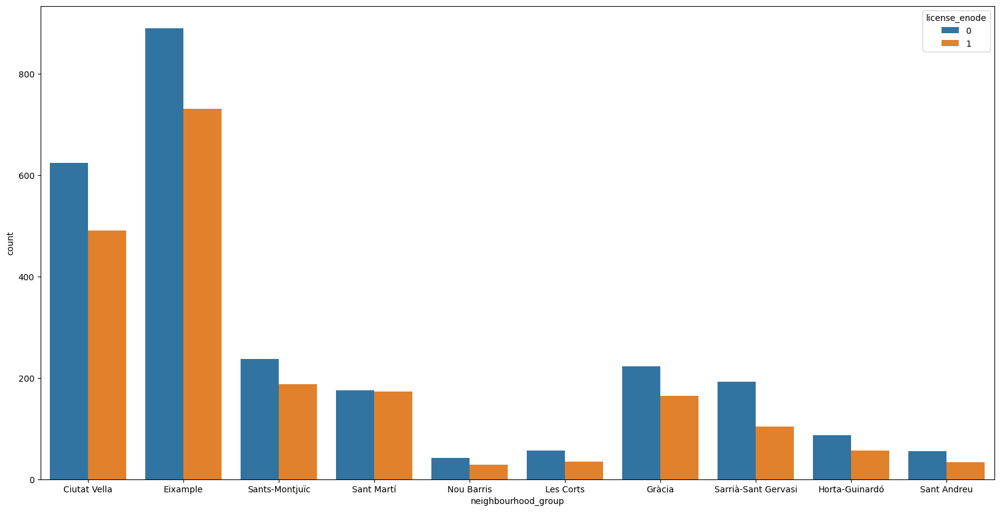

In [195]:
plt.figure(figsize=(20,10))
sns.countplot(data=no_last_review,x="neighbourhood_group",hue="license_enode")

<Axes: xlabel='rating', ylabel='Count'>

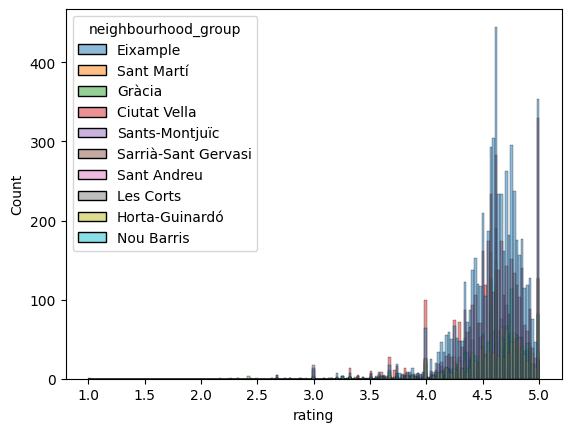

In [196]:
sns.histplot(x="rating",hue="neighbourhood_group",data=no_outliers)

In [197]:
no_outliers.groupby("neighbourhood_group")["rating"].agg([np.median])

,median
neighbourhood_group,
Ciutat Vella,4.619271
Eixample,4.625000
Gràcia,4.650000
Horta-Guinardó,4.630000
Les Corts,4.619271
Nou Barris,4.619271
Sant Andreu,4.619271
Sant Martí,4.619271
Sants-Montjuïc,4.619271


In [ ]:
examp_neighbourhood = no_outliers[no_outliers["neighbourhood_group"]=="Eixample"]

<Axes: xlabel='rating', ylabel='Count'>

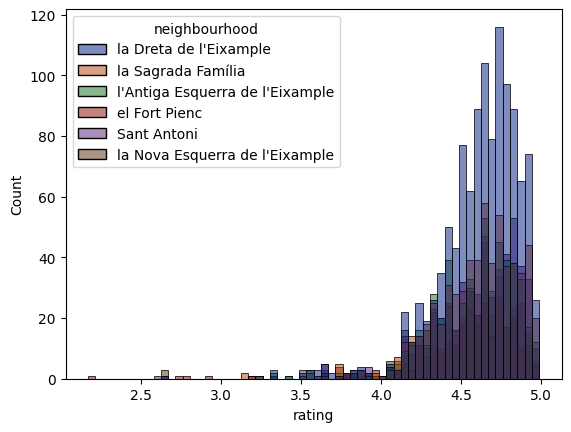

In [ ]:
sns.histplot(x="rating",hue="neighbourhood",data=examp_neighbourhood,palette="dark")

<Axes: xlabel='price', ylabel='Count'>

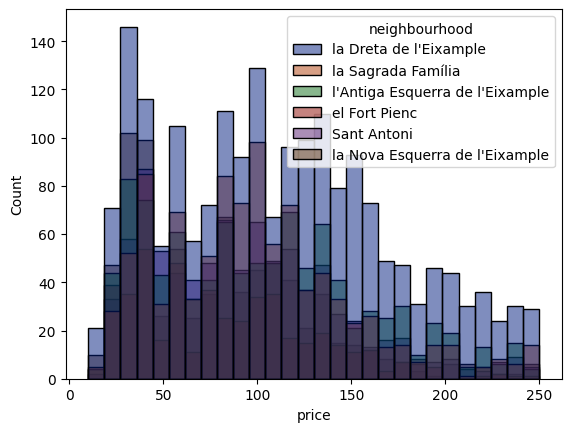

In [ ]:
sns.histplot(x="price",hue="neighbourhood",data=examp_neighbourhood,palette="dark")

In [ ]:
#pip install sklearn

  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [ ]:
from sklearn.manifold import TSNE

In [ ]:
from sklearn.preprocessing import StandardScaler

In [ ]:
#no_outliers.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license,rating,descrption,bedrooms,beds,bath,license_enode
0,17475,Rental unit in 08013 Barcelona · ★4.40 · 1 bed...,65623,Luca,Eixample,la Dreta de l'Eixample,41.399390,2.17044,Entire home/apt,140.0,5,26,2023-12-04,0.16,1,32,9,0,4.40,Rental unit in 08013 Barcelona,1,1,1 bath,0
1,18674,Rental unit in Barcelona · ★4.33 · 3 bedrooms ...,71615,Mireia Maria,Eixample,la Sagrada Família,41.405560,2.17262,Entire home/apt,121.0,1,40,2023-11-07,0.31,30,39,7,HUTB-002062,4.33,Rental unit in Barcelona,3,3,2 bath,1
3,23197,Rental unit in Sant Adria de Besos · ★4.77 · 3...,90417,Etain (Marnie),Sant Martí,el Besòs i el Maresme,41.412432,2.21975,Entire home/apt,200.0,3,75,2023-11-25,0.48,2,300,11,HUTB005057,4.77,Rental unit in Sant Adria de Besos,3,3,2 bath,1
4,32711,Rental unit in Barcelona · ★4.48 · 2 bedrooms ...,135703,Nick,Gràcia,el Camp d'en Grassot i Gràcia Nova,41.405660,2.17015,Entire home/apt,79.0,1,99,2023-10-18,0.66,3,297,16,HUTB-001722,4.48,Rental unit in Barcelona,2,2,5 bath,1
5,199794,Rental unit in Barcelona · ★4.80 · 1 bedroom ·...,440825,Teresa,Eixample,l'Antiga Esquerra de l'Eixample,41.383590,2.15812,Private room,48.0,4,168,2023-11-18,1.34,1,18,29,Exempt,4.80,Rental unit in Barcelona,1,1,2 shared bath,1


In [ ]:
#no_outliers.columns

Index(['id', 'name', 'host_id', 'host_name', 'neighbourhood_group',
       'neighbourhood', 'latitude', 'longitude', 'room_type', 'price',
       'minimum_nights', 'number_of_reviews', 'last_review',
       'reviews_per_month', 'calculated_host_listings_count',
       'availability_365', 'number_of_reviews_ltm', 'license', 'rating',
       'descrption', 'bedrooms', 'beds', 'bath', 'license_enode'],
      dtype='object')

In [ ]:
#tsne_df = no_outliers[["price","minimum_nights","number_of_reviews","calculated_host_listings_count","availability_365","number_of_reviews_ltm","bedrooms","license_enode"]]

In [ ]:
#x_scl = StandardScaler().fit_transform(tsne_df)

In [ ]:
#tsne = TSNE()

In [ ]:
#s_red = tsne.fit_transform(x_scl)

In [ ]:
#s_red.shape

In [ ]:
#plt.scatter(s_red[:,0],s_red[:,1])

<Axes: xlabel='room_type', ylabel='number_of_reviews'>

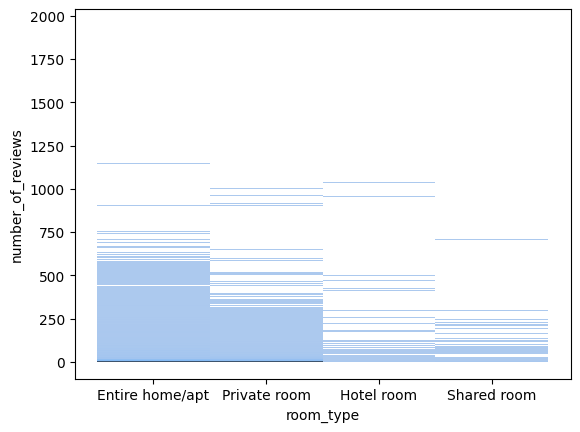

In [ ]:
#sns.histplot(data=no_outliers,x="room_type",y="number_of_reviews")

<Axes: xlabel='rating', ylabel='Count'>

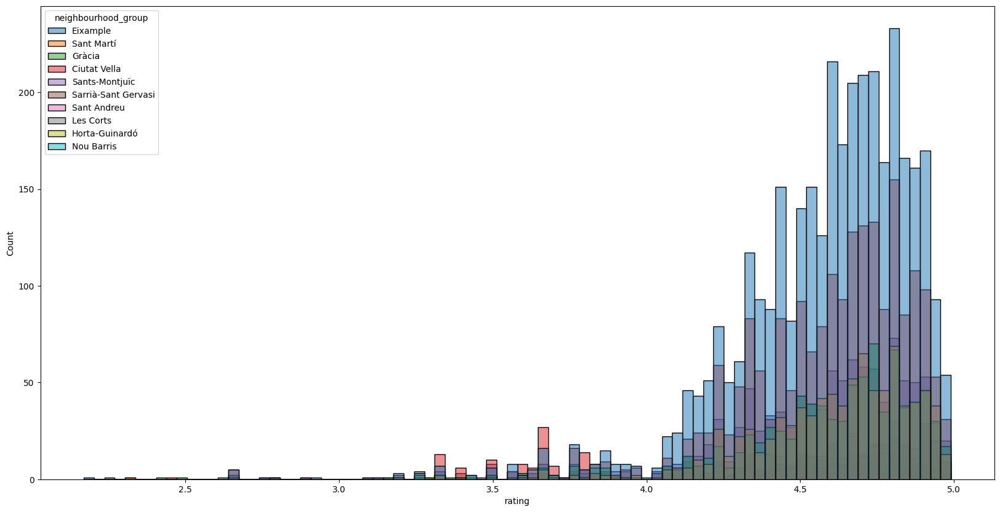

In [ ]:
#plt.figure(figsize=(20,10))
#sns.histplot(x="rating",hue="neighbourhood_group",data=no_outliers)

In [205]:
mask = ((no_outliers["number_of_reviews"] == 0 ) & (no_outliers["room_type"]=="Hotle room"))

In [207]:
len(no_outliers[mask])

0

In [198]:
df_rating4 = no_outliers[no_outliers["rating"]<4]

**top hosts take low rating under 4**

In [201]:
df_rating4["host_name"].value_counts()

My Space Capital                       26
My Space New                           21
Alcam Apartments                       21
Aline I Andrea                         20
My Space Barcelona,                    20
BeBarceloner                           16
AB Apartment Barcelona                 15
Hostal                                 15
SweetInn                               13
KeyBarcelona                           11
Enter                                  10
Ukio                                   10
Homenfun                               10
Javier                                  9
BBarcelona Apartments                   8
Apartime                                7
Artur                                   7
Lodging Team                            6
Maria Soledad                           5
Tania & Gonzalo                         5
B&F Accommodations                      5
Acomodis Apartments                     5
Luis                                    5
Manuel                            

In [204]:
px.pie(data_frame=no_outliers,names="neighbourhood_group")

# Conclusion



>According to the study, the Eiaxmple neighbourhood group has the highest demand for listings, accounting for 35.1% of the market, followed by Cuta Villa with 24.1%. The data preparation above indicates that the majority of the properties in Eiaxmple are highly rated.

> regarding the costs pricing vary according on the type of accommodation, the number of beds, the neighbourhood, and the licences. We found that listings with licences cost more than other listings, while listings with more lastings and ratings typically had higher pricing.



> avaliblity not playing a vital roal here regrading the price or the rating but we can see it differ from listing to the other and some time depend on room type






# advices


> This is an opportunity to enter the market because some neighbourhoods do not have hotel rooms, especially now that we can observe the demand for hotel rooms. In this data, no hotel room did not receive  a review.





> as the number of bed rooms incerese above 6 usually the listing chang to other room type shared room and that decrease thee price

